##drive mounting

In [10]:
from google.colab import drive
drive.mount('/content/drive')

# Navigate to the Homework directory in your Google Drive
%cd /content/drive/MyDrive/Applied AI/AI Project 2024-2025

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/.shortcut-targets-by-id/1Ng-U4g8su7jEQM-fjMtbVxvsiHYrRyQu/AI Project 2024-2025


##importing libraries

In [11]:
# Set seed for reproducibility
seed = 42

# Import necessary libraries
import os

# Set environment variables before importing modules
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd() + '/configs/'

# Suppress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

# Import necessary modules
import logging
import random
import numpy as np

# Set seeds for random number generators in NumPy and Python
np.random.seed(seed)
random.seed(seed)

import tensorflow as tf
from tensorflow import keras as tfk
#import keras as tfk       #notice how I'm importing keras and not tensorflow.keras
#from keras.layers import Input, Dense, Dropout, Lambda
from tensorflow.keras.layers import Input, Dense, Dropout, Lambda
from keras import layers as tfkl

# Set seed for TensorFlow
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)

# Reduce TensorFlow verbosity
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

print(f"Tensorflow version -> {tf.__version__}")
print(f"Keras version -> {tfk.__version__}")
# Print TensorFlow version
print(tf.__version__)

# Import other libraries
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns
from PIL import Image
import matplotlib.gridspec as gridspec
import os

# Configure plot display settings
sns.set(font_scale=1.4)
sns.set_style('white')
plt.rc('font', size=14)
%matplotlib inline

Tensorflow version -> 2.18.0
Keras version -> 3.8.0
2.18.0


##loading data

In [12]:
data_path='dataset_lung.xlsx'
df=pd.read_excel(data_path)
df.head()

,Full_slice,Nodule,TumorClass
0,pat1_fullslice.nrrd,pat1_nodule.nrrd,5
1,pat2_fullslice.nrrd,pat2_nodule.nrrd,5
2,pat3_fullslice.nrrd,pat3_nodule.nrrd,2
3,pat4_fullslice.nrrd,pat4_nodule.nrrd,5
4,pat5_fullslice.nrrd,pat5_nodule.nrrd,4


In [13]:
patients=(df.shape[0])
patients

2363

In [14]:
!pip install pynrrd
import nrrd

In [16]:
!pip install SimpleITK
import SimpleITK as sitk

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.3/52.3 MB 19.6 MB/s eta 0:00:00


In [15]:
# Funzione per ridimensionare un'immagine
def resize_image(image, target_shape):
    sitk_image = sitk.GetImageFromArray(image)
    resampler = sitk.ResampleImageFilter()
    resampler.SetOutputSpacing([old_dim / new_dim for old_dim, new_dim in zip(image.shape, target_shape)])
    resampler.SetSize(target_shape)
    resampler.SetInterpolator(sitk.sitkLinear)
    resized_image = sitk.GetArrayFromImage(resampler.Execute(sitk_image))
    return resized_image

In [17]:
folder_path = "Train"

target_shape=(124,124)
#images=np.zeros((2415,target_shape[0],target_shape[1]))
images=[]
titles=[]
# Itera sui file nella cartella
for file_name in os.listdir(folder_path):
    if file_name.endswith("fullslice.nrrd"):  # Controlla l'estensione
        file_path = os.path.join(folder_path, file_name)
        print(f"Processing file: {file_name}")

        # Leggi il file NRRD
        data, header = nrrd.read(file_path)
        data=resize_image(data, target_shape)
        #images[int(file_name.split('_')[0].replace('pat', ''))-1]=data
        titles.append(file_name)
        images.append(data)
        # Mostra alcune informazioni
        #print(f"Dimensione dei dati: {data.shape}")
        #print(f"Header: {header}")

Processing file: pat401_fullslice.nrrd
Processing file: pat444_fullslice.nrrd
Processing file: pat40_fullslice.nrrd
Processing file: pat438_fullslice.nrrd
Processing file: pat433_fullslice.nrrd
Processing file: pat3_fullslice.nrrd
Processing file: pat423_fullslice.nrrd
Processing file: pat398_fullslice.nrrd
Processing file: pat446_fullslice.nrrd
Processing file: pat424_fullslice.nrrd
Processing file: pat395_fullslice.nrrd
Processing file: pat440_fullslice.nrrd
Processing file: pat399_fullslice.nrrd
Processing file: pat431_fullslice.nrrd
Processing file: pat418_fullslice.nrrd
Processing file: pat394_fullslice.nrrd
Processing file: pat406_fullslice.nrrd
Processing file: pat442_fullslice.nrrd
Processing file: pat39_fullslice.nrrd
Processing file: pat425_fullslice.nrrd
Processing file: pat421_fullslice.nrrd
Processing file: pat414_fullslice.nrrd
Processing file: pat396_fullslice.nrrd
Processing file: pat436_fullslice.nrrd
Processing file: pat412_fullslice.nrrd
Processing file: pat426_fulls

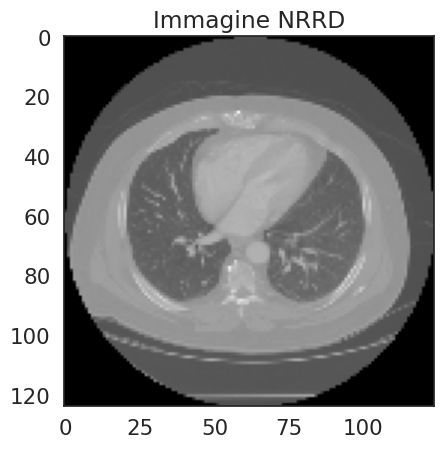

In [18]:
# Visualizza l'immagine
plt.imshow(images[0], cmap="gray")
plt.title("Immagine NRRD")
plt.show()

In [19]:
print(titles)
print()

['pat401_fullslice.nrrd', 'pat444_fullslice.nrrd', 'pat40_fullslice.nrrd', 'pat438_fullslice.nrrd', 'pat433_fullslice.nrrd', 'pat3_fullslice.nrrd', 'pat423_fullslice.nrrd', 'pat398_fullslice.nrrd', 'pat446_fullslice.nrrd', 'pat424_fullslice.nrrd', 'pat395_fullslice.nrrd', 'pat440_fullslice.nrrd', 'pat399_fullslice.nrrd', 'pat431_fullslice.nrrd', 'pat418_fullslice.nrrd', 'pat394_fullslice.nrrd', 'pat406_fullslice.nrrd', 'pat442_fullslice.nrrd', 'pat39_fullslice.nrrd', 'pat425_fullslice.nrrd', 'pat421_fullslice.nrrd', 'pat414_fullslice.nrrd', 'pat396_fullslice.nrrd', 'pat436_fullslice.nrrd', 'pat412_fullslice.nrrd', 'pat426_fullslice.nrrd', 'pat392_fullslice.nrrd', 'pat500_fullslice.nrrd', 'pat487_fullslice.nrrd', 'pat47_fullslice.nrrd', 'pat456_fullslice.nrrd', 'pat492_fullslice.nrrd', 'pat474_fullslice.nrrd', 'pat486_fullslice.nrrd', 'pat46_fullslice.nrrd', 'pat4_fullslice.nrrd', 'pat481_fullslice.nrrd', 'pat484_fullslice.nrrd', 'pat482_fullslice.nrrd', 'pat485_fullslice.nrrd', 'pat451

In [20]:
df.head()

,Full_slice,Nodule,TumorClass
0,pat1_fullslice.nrrd,pat1_nodule.nrrd,5
1,pat2_fullslice.nrrd,pat2_nodule.nrrd,5
2,pat3_fullslice.nrrd,pat3_nodule.nrrd,2
3,pat4_fullslice.nrrd,pat4_nodule.nrrd,5
4,pat5_fullslice.nrrd,pat5_nodule.nrrd,4


In [21]:
ordered_titles = df['Full_slice'].tolist()
title_to_image = dict(zip(titles, images))
# Riordina le immagini in base all'ordine dei titoli nel DataFrame
ordered_images = [title_to_image[title] for title in ordered_titles]


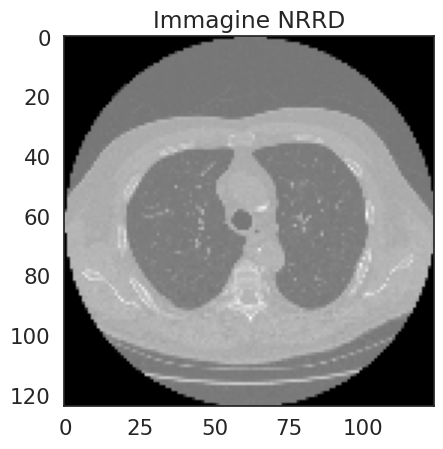

In [22]:
# Visualizza l'immagine
plt.imshow(ordered_images[1961], cmap="gray")
plt.title("Immagine NRRD")
plt.show()

In [23]:
categorical_labels=df['TumorClass'].values
print(categorical_labels)

[5 5 2 ... 5 5 5]


In [24]:
binary_labels=np.where((categorical_labels==1)|(categorical_labels==2|(categorical_labels==3)), 0, 1)
print(binary_labels)

[1 1 0 ... 1 1 1]


###visual inspection

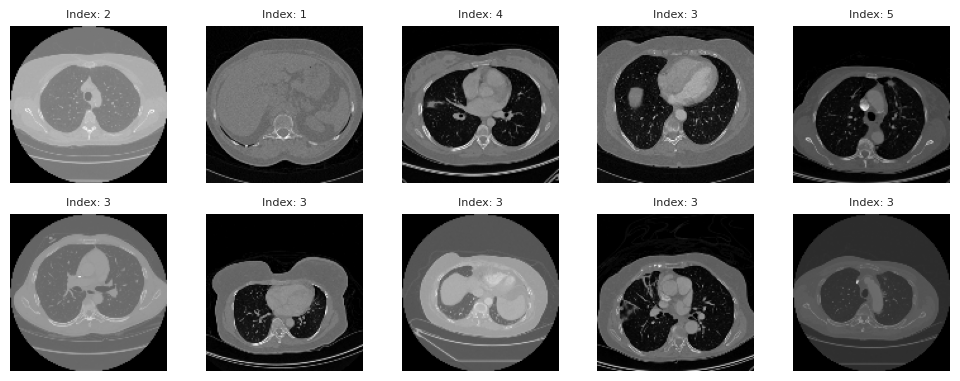

In [25]:
X=np.array(ordered_images)
y=np.array(categorical_labels)
z=np.array(binary_labels)
# Number of images to display
num_images_to_display = 10

# Generate 10 random indices from the range of available data
random_indices = np.random.choice(min(len(X), len(y)), num_images_to_display, replace=False)

# Set up a 2x5 grid for displaying images
fig, axs = plt.subplots(2, 5, figsize=(10, 4))  # 2 rows, 5 columns

for idx, i in enumerate(random_indices):
    row = idx // 5  # Determine row index (0 or 1)
    col = idx % 5   # Determine column index (0 to 4)

    axs[row, col].imshow(np.squeeze(X[i]), cmap='gray')
    axs[row, col].set_title(f'Index: {y[i]}', fontsize=8)
    axs[row, col].axis('off')

plt.tight_layout()
plt.show()


In [26]:
print(y)
y.shape

[5 5 2 ... 5 5 5]


(2363,)

In [27]:
classes=['1','2','3','4','5']
#Check class numerosity
# Get shapes for each class in y_train
y=y-1
for class_idx, class_name in enumerate(classes):
    y_class = y[y == class_idx]
    print(f"Numerosity of {class_name} images in training set: {y_class.shape[0]}")

print("\n")

Numerosity of 1 images in training set: 244
Numerosity of 2 images in training set: 457
Numerosity of 3 images in training set: 1092
Numerosity of 4 images in training set: 418
Numerosity of 5 images in training set: 152




In [28]:
cat_classes=['Benign','Malignant']
for class_idx, class_name in enumerate(cat_classes):
    z_class = z[z == class_idx]
    print(f"Numerosity of {class_name} images in training set: {z_class.shape[0]}")

print("\n")

Numerosity of Benign images in training set: 1793
Numerosity of Malignant images in training set: 570




#Binary problem


##data processing

In [29]:
min_val = np.min(X)
max_val = np.max(X)
X= (X - min_val) / (max_val - min_val).astype('float32')
print(z)

[1 1 0 ... 1 1 1]


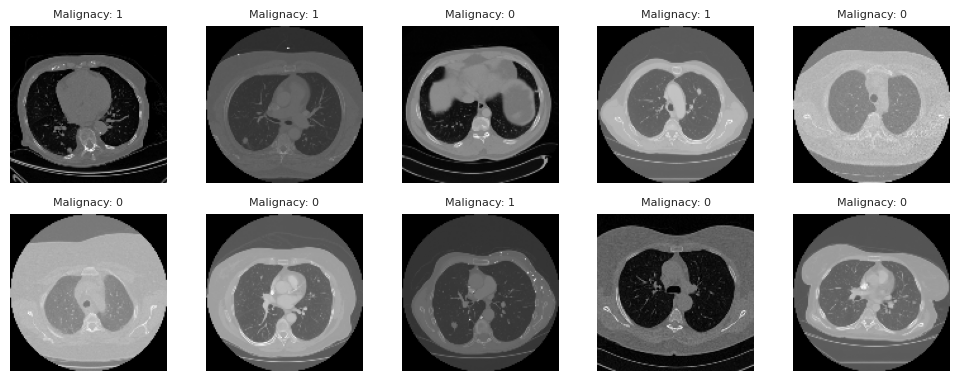

In [30]:
num_images_to_display = 10

# Generate 10 random indices from the range of available data
random_indices = np.random.choice(min(len(X), len(z)), num_images_to_display, replace=False)

# Set up a 2x5 grid for displaying images
fig, axs = plt.subplots(2, 5, figsize=(10, 4))  # 2 rows, 5 columns

for idx, i in enumerate(random_indices):
    row = idx // 5  # Determine row index (0 or 1)
    col = idx % 5   # Determine column index (0 to 4)

    axs[row, col].imshow(np.squeeze(X[i]), cmap='gray')
    axs[row, col].set_title(f'Malignacy: {z[i]}', fontsize=8)
    axs[row, col].axis('off')

plt.tight_layout()
plt.show()

In [31]:
# Data splitting
X_train_val, X_test, z_train_val, z_test = train_test_split(X, z, random_state=seed, test_size=0.1, stratify=z)
X_train, X_val, z_train, z_val = train_test_split(X_train_val, z_train_val, random_state=seed, test_size=z_test.shape[0], stratify=z_train_val)

# Print the shapes of the resulting datasets
print("Training Data Shape:", X_train.shape)
print("Training Label Shape:", z_train.shape)
print("Validation Data Shape:", X_val.shape)
print("Validation Label Shape:", z_val.shape)
print("Test Data Shape:", X_test.shape)
print("Test Label Shape:", z_test.shape)

Training Data Shape: (1889, 124, 124)
Training Label Shape: (1889,)
Validation Data Shape: (237, 124, 124)
Validation Label Shape: (237,)
Test Data Shape: (237, 124, 124)
Test Label Shape: (237,)


In [32]:
import gc
del X, z

gc.collect()

21114

In [33]:
#Check class numerosity
# Get shapes for each class in y_train
for class_idx, class_name in enumerate(cat_classes):
    # Filter y_train for the current class index by checking if the one-hot column is 1
    z_class_train = z_train[z_train == class_idx]
    print(f"Numerosity of {class_name} images in training set: {z_class_train.shape[0]}")

print("\n")

Numerosity of Benign images in training set: 1433
Numerosity of Malignant images in training set: 456




In [34]:
num_classes=2
print(num_classes)

2


In [35]:
from sklearn.utils.class_weight import compute_class_weight

In [36]:
class_weights = compute_class_weight('balanced', classes=np.unique(z_train), y=z_train)

# Convert to a dictionary format required by Keras
class_weights_dict = {i: weight for i, weight in enumerate(class_weights)}
class_weights_dict[0]=0.5
class_weights_dict[1]=2.5

print("Class Weights:", class_weights_dict)

Class Weights: {0: 0.5, 1: 2.5}


In [37]:
#X_train=np.expand_dims(X_train, axis=-1)
#X_val=np.expand_dims(X_val, axis=-1)
#X_test=np.expand_dims(X_test, axis=-1)
#X_train.shape

In [ ]:
#X_train=np.stack([X_train] * 3, axis=-1)
#X_val=np.stack([X_val] * 3, axis=-1)
#X_test=np.stack([X_test] * 3, axis=-1)
#X_train.shape

In [38]:
def sigmoidal_contrast(image, cutoff, gain=10):
    """
    Apply sigmoidal contrast enhancement to an image.

    Parameters:
        image (numpy.ndarray): Grayscale input image.
        cutoff (float): The gray value around which contrast is adjusted (e.g., the mean value).
        gain (float): Controls the slope of the sigmoid. Higher values increase contrast.

    Returns:
        numpy.ndarray: Image with enhanced contrast.
    """

    # Apply sigmoid function
    sigmoidal_image = 1 / (1 + np.exp(-gain * (image - cutoff )))

    # Rescale to range [0, 255] and convert to uint8
    enhanced_image = (sigmoidal_image).astype(np.float32)

    return enhanced_image


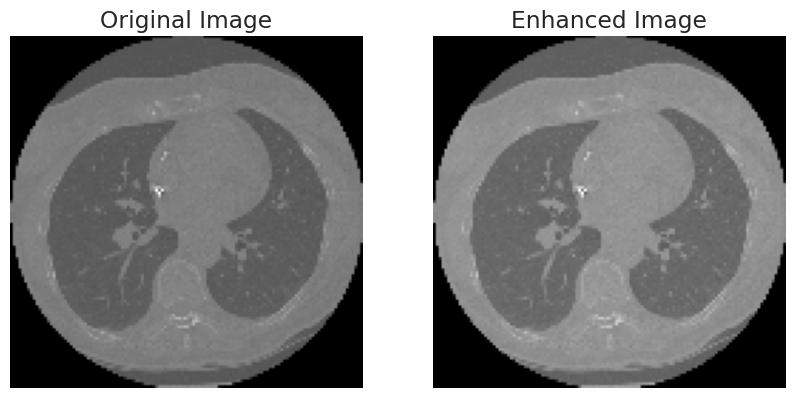

In [39]:
# Calculate the mean gray value (cutoff)
image=X_train[0]
mean_value = np.mean(image)

# Apply sigmoidal contrast enhancement
enhanced_image = sigmoidal_contrast(image, cutoff=mean_value, gain=10)

    # Display original and enhanced images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image, cmap="gray")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Enhanced Image")
plt.imshow(enhanced_image, cmap="gray")
plt.axis("off")

plt.show()

In [40]:
def process_images(images, gain=10):
    """
    Apply sigmoidal contrast enhancement to a list of images.

    Parameters:
        images (list of numpy.ndarray): List of grayscale images.
        gain (float): Controls the slope of the sigmoid. Higher values increase contrast.

    Returns:
        list of numpy.ndarray: List of enhanced images.
    """
    enhanced_images = []
    for image in images:
        if image is None:
            print("Warning: Found a None image. Skipping.")
            continue

        # Calculate the mean gray value (cutoff)
        mean_value = np.mean(image)

        # Apply sigmoidal contrast enhancement
        enhanced_image = sigmoidal_contrast(image, cutoff=mean_value, gain=gain)
        enhanced_images.append(enhanced_image)

    return enhanced_images

In [41]:
def process_images_in_batches(images, batch_size, gain=10):
    """
    Apply sigmoidal contrast enhancement to images in batches.

    Parameters:
        images (list of numpy.ndarray): List of grayscale images.
        batch_size (int): Number of images to process in each batch.
        gain (float): Controls the slope of the sigmoid. Higher values increase contrast.

    Returns:
        list of numpy.ndarray: List of enhanced images.
    """
    enhanced_images = []
    for i in tqdm(range(0, len(images), batch_size)):
        batch = images[i:i + batch_size]
        for image in batch:
            if image is None:
                print("Warning: Found a None image. Skipping.")
                continue

            # Calculate the mean gray value (cutoff)
            mean_value = np.mean(image)

            # Apply sigmoidal contrast enhancement
            enhanced_image = sigmoidal_contrast(image, cutoff=mean_value, gain=gain)
            enhanced_images.append(enhanced_image)

    return enhanced_images


In [42]:
from tqdm import tqdm

In [43]:
# Process images in batches
X_train = process_images_in_batches(X_train, batch_size=32, gain=10)


100%|██████████| 60/60 [00:00<00:00, 76.04it/s]


In [44]:
X_train=np.array(X_train)

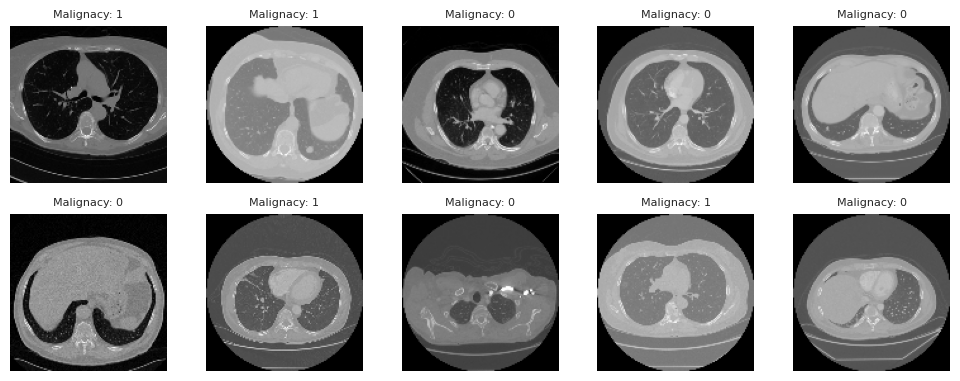

In [45]:
num_images_to_display = 10

# Generate 10 random indices from the range of available data
random_indices = np.random.choice(min(len(X_train), len(z_train)), num_images_to_display, replace=False)

# Set up a 2x5 grid for displaying images
fig, axs = plt.subplots(2, 5, figsize=(10, 4))  # 2 rows, 5 columns

for idx, i in enumerate(random_indices):
    row = idx // 5  # Determine row index (0 or 1)
    col = idx % 5   # Determine column index (0 to 4)

    axs[row, col].imshow((X_train[i]),cmap='gray')
    axs[row, col].set_title(f'Malignacy: {z_train[i]}', fontsize=8)
    axs[row, col].axis('off')

plt.tight_layout()
plt.show()

##building the model

In [46]:
# Input shape for the model
# Assuming X_train is your grayscale image data
X_train = np.stack([X_train] * 3, axis=-1)  # Replicate grayscale channel 3 times
X_val = np.stack([X_val] * 3, axis=-1)  # Replicate grayscale channel 3 times
X_test = np.stack([X_test] * 3, axis=-1)  # Replicate grayscale channel 3 times
input_shape = X_train.shape[1:]

# Output shape for the model
output_shape = 1

print("Input Shape:", input_shape)
print("Output Shape:", output_shape)

Input Shape: (124, 124, 3)
Output Shape: 1


## Augmentation Upsampling

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
import numpy as np
import random

# Calculate the target count based on the most numerous class in `y_train`
unique, counts = np.unique(z_train, return_counts=True)
class_counts = dict(zip(unique, counts))
#target_count = max(class_counts.values())
target_counts = {label: count * 2 for label, count in class_counts.items()}  # Double each class count

# Initialize the data generator with augmentation parameters
datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    #rescale=1./255,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest'
)

# Prepare lists to store the augmented images and labels
augmented_images = []
augmented_labels = []


# Augment each class to double its original size
for class_label, original_count in class_counts.items():
    indices = np.where(z_train == class_label)[0]
    X_train_class = X_train[indices]

    # Number of augmentations needed to double the class size
    #num_augmentations = original_count
    num_augmentations = 500
    i = 0
    while i < num_augmentations:
        img = random.choice(X_train_class)
        x = img.reshape((1,) + img.shape)  # Add batch dimension

        for batch in datagen.flow(x, batch_size=1):
            augmented_images.append(batch[0])  # Store augmented image
            augmented_labels.append(class_label)  # Store label
            i += 1
            break  # Generate only one image per loop iteration

# Convert augmented data to NumPy arrays
augmented_images = np.array(augmented_images)
augmented_labels = np.array(augmented_labels).astype(np.uint8)  # Ensure integer labels


# Append the augmented images and labels back to `X_train` and `y_train`
X_train_balanced = np.concatenate((X_train, augmented_images), axis=0)
z_train_balanced = np.concatenate((z_train, augmented_labels), axis=0)

# Verify the new class counts in `y_train_balanced`
unique_balanced, counts_balanced = np.unique(z_train_balanced, return_counts=True)
class_counts_balanced = dict(zip(unique_balanced, counts_balanced))

# Print the final shape and counts of each class in `X_train_balanced`
#print("Class counts before balancing:")
#for class_label, count in class_counts.items():
#    print(f"Class {class_label}: {count}")
#print("\nFinal shapes:")
#print(f"X_train shape: {X_train.shape}")
#print(f"z_train shape: {z_train.shape}")

# Print the final shape and counts of each class in `X_train_balanced`
print("Class counts after balancing:")
for class_label, count in class_counts_balanced.items():
    print(f"Class {class_label}: {count}")
print("\nFinal shapes:")
print(f"X_train_balanced shape: {X_train_balanced.shape}")
print(f"z_train_balanced shape: {z_train_balanced.shape}")

X_train=np.array(X_train_balanced)
z_train=np.array(z_train_balanced)

Class counts after balancing:
Class 0: 1933
Class 1: 956

Final shapes:
X_train_balanced shape: (2889, 124, 124, 3)
z_train_balanced shape: (2889,)


In [47]:
!pip install keras_cv

shell-init: error retrieving current directory: getcwd: cannot access parent directories: No such file or directory
shell-init: error retrieving current directory: getcwd: cannot access parent directories: No such file or directory
The folder you are executing pip from can no longer be found.


In [ ]:
import keras_cv
from tensorflow.keras.layers import CenterCrop, RandomRotation, RandomTranslation, RandomFlip, RandomZoom, RandomCrop, Resizing, RandomContrast,RandomBrightness, RandomShear

# Define your geometric augmentation layers
augmentation_layers = tf.keras.Sequential([
    CenterCrop(height=96, width=96),
    RandomRotation(0.3),  # Rotate by up to 20%
    RandomTranslation(0.2, 0.2),  # Translate by up to 10% of image height/width
    RandomFlip("horizontal_and_vertical"),  # Flip both horizontally and vertically
    #RandomZoom(height_factor=(-0.2, 0.2), width_factor=(-0.2, 0.2)),
    #RandomCrop(96,96),
    Resizing(input_shape[0], input_shape[1])

])



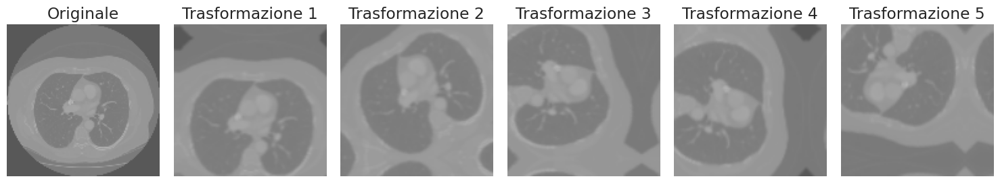

In [ ]:
#image=X_train[:5]*255
image=X_train[100]*255
#print(image.shape)

augmented_images = []
for _ in range(5):  # Genera 5 trasformazioni per visualizzare la variazione
    augmented_image = augmentation_layers(image, training=True)
    augmented_images.append(augmented_image.numpy())  # Aggiungi la trasformazione alla lista

#print(np.array(augmented_images).shape)

# Visualizza le immagini
plt.figure(figsize=(15, 5))

# Mostra l'immagine originale
plt.subplot(1, 6, 1)
plt.imshow(image.astype(np.uint8),cmap='gray')
plt.title("Originale")
plt.axis('off')

# Mostra le immagini trasformate
for i, aug_img in enumerate(augmented_images):
    plt.subplot(1, 6, i + 2)
    plt.imshow(aug_img.astype(np.uint8),cmap='gray')
    plt.title(f"Trasformazione {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
del augmentation_layers

gc.collect()

12391

In [ ]:
import tensorflow as tf
import keras_cv


crop_image=tf.keras.Sequential([
      CenterCrop(height=96, width=96),
      Resizing(input_shape[0], input_shape[1])
])


augmentation_layers = tf.keras.Sequential([
    #CenterCrop(height=96, width=96),
    RandomRotation(0.45, fill_mode='nearest'),  # Rotate by up to 20%
    RandomTranslation(0.3, 0.3, fill_mode='nearest'),  # Translate by up to 10% of image height/width
    RandomFlip("horizontal_and_vertical"),  # Flip both horizontally and vertically
    #RandomZoom(height_factor=(-0.1, 0.1), width_factor=(-0.1, 0.1), fill_mode='nearest'),
    RandomBrightness(0.2, value_range=(0, 255)),
    RandomContrast(0.25, value_range=(0, 255)),
    RandomShear(0.2, 0.2, fill_mode='nearest'),
    #RandomCrop(96, 96),
    #Resizing(input_shape[0], input_shape[1])

])


# Creazione dei dataset
batch_size = 32

train_ds = tf.data.Dataset.from_tensor_slices((X_train*255, z_train))
validation_dataset = tf.data.Dataset.from_tensor_slices((X_val*255, z_val))
test_ds=tf.data.Dataset.from_tensor_slices((X_test*255, z_test))


train_ds = train_ds.batch(batch_size)
validation_dataset = validation_dataset.batch(batch_size)
test_ds=test_ds.batch(batch_size)

def apply_crop(images, labels):
    images = crop_image(images)
    return images, labels

# Funzione per applicare RandAugment
def apply_augmentation(images, labels):
    images = augmentation_layers(images)  # Applica RandAugment solo alle immagini
    return images, labels

def apply_contrast(images, labels):
    images = ((process_images((images/255), gain=10))*255)
    return images, labels

# Applica RandAugment al dataset di addestramento
train_ds = train_ds.map(apply_crop, num_parallel_calls=tf.data.AUTOTUNE)
train_ds=train_ds.map(apply_augmentation, num_parallel_calls=tf.data.AUTOTUNE)
validation_dataset = validation_dataset.map(apply_crop, num_parallel_calls=tf.data.AUTOTUNE)
test_ds=test_ds.map(apply_crop, num_parallel_calls=tf.data.AUTOTUNE)
#train_ds = train_ds.map(apply_contrast, num_parallel_calls=tf.data.AUTOTUNE)

# Funzione di preprocessing per normalizzare le immagini
def preprocess_for_model(images, labels):
    images = tf.cast(images, tf.float32)
    labels=tf.cast(labels, tf.float32)
    return images, labels

# Preprocessing sui dataset
train_ds = train_ds.map(preprocess_for_model, num_parallel_calls=tf.data.AUTOTUNE)
validation_dataset = validation_dataset.map(preprocess_for_model, num_parallel_calls=tf.data.AUTOTUNE)
test_ds=test_ds.map(preprocess_for_model, num_parallel_calls=tf.data.AUTOTUNE)

# Ottimizzazioni
train_ds = train_ds.cache()  # Cache in memoria
train_ds = train_ds.shuffle(buffer_size=1000)  # Mescola il dataset
train_ds = train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)  # Precarica i batch
validation_dataset = validation_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds=test_ds.prefetch(buffer_size=tf.data.AUTOTUNE)


###base model

In [48]:
%cd /content/drive/MyDrive/Applied AI/Marta

/content/drive/.shortcut-targets-by-id/1qmXbkd8A0zsyzPi4dm_LEqja1bF8YP7S/Applied AI/Marta


In [ ]:
from keras.applications import EfficientNetB2
import keras_cv

efficient=EfficientNetB2(include_top=False, weights='imagenet',  pooling='avg', input_shape=input_shape)
efficient.trainable=False # Freeze all layers for initial transfer learning


31790344/31790344 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)                   │ (None, 124, 124, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb2 (Functional)          │ (None, 1408)                │       7,768,569 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ input_layer_3 (InputLayer)      │ (None, 124, 124, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling (Rescaling)           │ (None, 124, 124, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ normalization (Normalization)   │ (None, 124, 124, 3)         │               7 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling_1 (Rescaling)         │ (None, 124, 124, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_conv_pad (ZeroPadding2D)   │ (None, 125, 125, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_conv (Conv2D)              │ (None, 62, 62, 32)          │             864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_bn (BatchNormalization)    │ (None, 62, 62, 32)          │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_activation (Activation)    │ (None, 62, 62, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_dwconv                  │ (None, 62, 62, 32)          │             288 │
│ (DepthwiseConv2D)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_bn (BatchNormalization) │ (None, 62, 62, 32)          │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_activation (Activation) │ (None, 62, 62, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_squeeze              │ (None, 32)                  │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_reshape (Reshape)    │ (None, 1, 1, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_reduce (Conv2D)      │ (None, 1, 1, 8)             │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_expand (Conv2D)      │ (None, 1, 1, 32)            │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_excite (Multiply)    │ (None, 62, 62, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_project_conv (Conv2D)   │ (None, 62, 62, 16)          │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_project_bn              │ (None, 62, 62, 16)          │              64 │
│ (BatchNormalization)                 │                             │              

 Total params: 7,858,810 (29.98 MB)

 Trainable params: 90,241 (352.50 KB)

 Non-trainable params: 7,768,569 (29.63 MB)

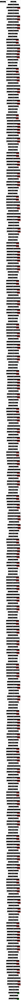

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras import optimizers as tfko # Import optimizers from tensorflow.keras.optimizers

inputs = layers.Input(shape=input_shape, name='input')


x = efficient(inputs)

# Add GlobalAveragePooling and Dropout
#x = tfkl.GlobalAveragePooling2D(name='gap')(x) #already included
#x = tfkl.Dropout(0.3, name='dropout')(x)
x=tfkl.Dense(64, activation='relu', name='dense')(x)
x = tfkl.Dropout(0.3, name='dropout')(x)

# Add a final Dense layer for classification
outputs = tfkl.Dense(1, activation='sigmoid', name='output')(x)

# Create the model
model = tfk.Model(inputs=inputs, outputs=outputs, name='model')
model = models.Model(inputs, outputs)

# Compile the model with categorical cross-entropy loss and Adam optimiser
model.compile(loss=tfk.losses.BinaryCrossentropy(), optimizer=tfko.AdamW(learning_rate=1e-3, weight_decay=1e-3), metrics=['accuracy'])

#Display model summary
model.summary(expand_nested=True)


# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [ ]:
# Train the model

history = model.fit(
    train_ds,
    epochs=1000,
    class_weight=class_weights_dict,
    validation_data=validation_dataset,
    callbacks=[tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=50, restore_best_weights=True)]
).history

# Calculate and print the best validation accuracy achieved
final_val_accuracy = round(max(history['val_accuracy']) * 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

# Save the trained model to a file, including final accuracy in the filename
model_filename = 'final_model_TL.keras'
model.save(model_filename)
print(f"Model saved as {model_filename} in /content/drive/MyDrive/APPLIED AI/progetto")

# Free memory by deleting the model instance
del model

Epoch 1/1000
91/91 ━━━━━━━━━━━━━━━━━━━━ 69s 329ms/step - accuracy: 0.3555 - loss: 0.7355 - val_accuracy: 0.2405 - val_loss: 1.2646
Epoch 2/1000
91/91 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - accuracy: 0.2978 - loss: 0.7047 - val_accuracy: 0.2405 - val_loss: 1.3277
Epoch 3/1000
91/91 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.3393 - loss: 0.7107 - val_accuracy: 0.2405 - val_loss: 1.0025
Epoch 4/1000
91/91 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - accuracy: 0.3339 - loss: 0.6699 - val_accuracy: 0.2405 - val_loss: 0.9756
Epoch 5/1000
91/91 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - accuracy: 0.3697 - loss: 0.6342 - val_accuracy: 0.2700 - val_loss: 0.9735
Epoch 6/1000
91/91 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.4152 - loss: 0.6577 - val_accuracy: 0.2447 - val_loss: 0.9447
Epoch 7/1000
91/91 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.4046 - loss: 0.6382 - val_accuracy: 0.2405 - val_loss: 1.0673
Epoch 8/1000
91/91 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.4016 - loss: 0.6344 - val_a

###fine tuning

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)                   │ (None, 124, 124, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb2 (Functional)          │ (None, 1408)                │       7,768,569 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ input_layer_3 (InputLayer)      │ (None, 124, 124, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling (Rescaling)           │ (None, 124, 124, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ normalization (Normalization)   │ (None, 124, 124, 3)         │               7 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling_1 (Rescaling)         │ (None, 124, 124, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_conv_pad (ZeroPadding2D)   │ (None, 125, 125, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_conv (Conv2D)              │ (None, 62, 62, 32)          │             864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_bn (BatchNormalization)    │ (None, 62, 62, 32)          │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_activation (Activation)    │ (None, 62, 62, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_dwconv                  │ (None, 62, 62, 32)          │             288 │
│ (DepthwiseConv2D)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_bn (BatchNormalization) │ (None, 62, 62, 32)          │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_activation (Activation) │ (None, 62, 62, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_squeeze              │ (None, 32)                  │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_reshape (Reshape)    │ (None, 1, 1, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_reduce (Conv2D)      │ (None, 1, 1, 8)             │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_expand (Conv2D)      │ (None, 1, 1, 32)            │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_excite (Multiply)    │ (None, 62, 62, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_project_conv (Conv2D)   │ (None, 62, 62, 16)          │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_project_bn              │ (None, 62, 62, 16)          │              64 │
│ (BatchNormalization)                 │                             │              

 Total params: 8,039,294 (30.67 MB)

 Trainable params: 90,241 (352.50 KB)

 Non-trainable params: 7,768,569 (29.63 MB)

 Optimizer params: 180,484 (705.02 KB)

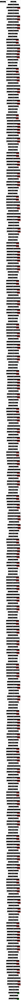

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model

model = load_model('tumor_classes_prova1.keras')

#Display summary
model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

0 input_layer_3 False
1 rescaling False
2 normalization False
3 rescaling_1 False
4 stem_conv_pad False
5 stem_conv False
6 stem_bn False
7 stem_activation False
8 block1a_dwconv False
9 block1a_bn False
10 block1a_activation False
11 block1a_se_squeeze False
12 block1a_se_reshape False
13 block1a_se_reduce False
14 block1a_se_expand False
15 block1a_se_excite False
16 block1a_project_conv False
17 block1a_project_bn False
18 block1b_dwconv False
19 block1b_bn False
20 block1b_activation False
21 block1b_se_squeeze False
22 block1b_se_reshape False
23 block1b_se_reduce False
24 block1b_se_expand False
25 block1b_se_excite False
26 block1b_project_conv False
27 block1b_project_bn False
28 block1b_drop False
29 block1b_add False
30 block2a_expand_conv False
31 block2a_expand_bn False
32 block2a_expand_activation False
33 block2a_dwconv_pad False
34 block2a_dwconv False
35 block2a_bn False
36 block2a_activation False
37 block2a_se_squeeze False
38 block2a_se_reshape False
39 block2a_se_re

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)                   │ (None, 124, 124, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb2 (Functional)          │ (None, 1408)                │       7,768,569 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ input_layer_3 (InputLayer)      │ (None, 124, 124, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling (Rescaling)           │ (None, 124, 124, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ normalization (Normalization)   │ (None, 124, 124, 3)         │               7 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling_1 (Rescaling)         │ (None, 124, 124, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_conv_pad (ZeroPadding2D)   │ (None, 125, 125, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_conv (Conv2D)              │ (None, 62, 62, 32)          │             864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_bn (BatchNormalization)    │ (None, 62, 62, 32)          │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_activation (Activation)    │ (None, 62, 62, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_dwconv                  │ (None, 62, 62, 32)          │             288 │
│ (DepthwiseConv2D)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_bn (BatchNormalization) │ (None, 62, 62, 32)          │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_activation (Activation) │ (None, 62, 62, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_squeeze              │ (None, 32)                  │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_reshape (Reshape)    │ (None, 1, 1, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_reduce (Conv2D)      │ (None, 1, 1, 8)             │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_expand (Conv2D)      │ (None, 1, 1, 32)            │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_excite (Multiply)    │ (None, 62, 62, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_project_conv (Conv2D)   │ (None, 62, 62, 16)          │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_project_bn              │ (None, 62, 62, 16)          │              64 │
│ (BatchNormalization)                 │                             │              

 Total params: 8,039,294 (30.67 MB)

 Trainable params: 7,578,777 (28.91 MB)

 Non-trainable params: 280,033 (1.07 MB)

 Optimizer params: 180,484 (705.02 KB)

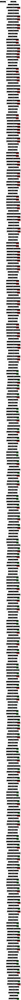

In [ ]:
# Set all layers in efficientnetb0 as trainable
model.get_layer('efficientnetb2').trainable = True

# Set all layers as non-trainable
for layer in model.get_layer('efficientnetb2').layers:
    layer.trainable = False

# Enable training only for Conv2D and DepthwiseConv2D layers
for i, layer in enumerate(model.get_layer('efficientnetb2').layers):
    if isinstance(layer, tf.keras.layers.Conv2D) or isinstance(layer, tf.keras.layers.DepthwiseConv2D):
        layer.trainable = True
       # print(i, layer.name, type(layer).__name__, layer.trainable)

# Set the number of layers to freeze
N = 124

# Set the first N layers as non-trainable
for i, layer in enumerate(model.get_layer('efficientnetb2').layers[:N]):
    layer.trainable = False

# Print layer indices, names, and trainability status
for i, layer in enumerate(model.get_layer('efficientnetb2').layers):
    print(i, layer.name, layer.trainable)


model.summary(expand_nested=True)


# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

##training

In [ ]:
# Define the patience value for early stopping
patience = 25

# Create an EarlyStopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',
    patience=patience,
    restore_best_weights=True,
)

# Store the callback in a list
callbacks = [early_stopping]

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)                   │ (None, 124, 124, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb2 (Functional)          │ (None, 1408)                │       7,768,569 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ input_layer_3 (InputLayer)      │ (None, 124, 124, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling (Rescaling)           │ (None, 124, 124, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ normalization (Normalization)   │ (None, 124, 124, 3)         │               7 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling_1 (Rescaling)         │ (None, 124, 124, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_conv_pad (ZeroPadding2D)   │ (None, 125, 125, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_conv (Conv2D)              │ (None, 62, 62, 32)          │             864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_bn (BatchNormalization)    │ (None, 62, 62, 32)          │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ stem_activation (Activation)    │ (None, 62, 62, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_dwconv                  │ (None, 62, 62, 32)          │             288 │
│ (DepthwiseConv2D)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_bn (BatchNormalization) │ (None, 62, 62, 32)          │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_activation (Activation) │ (None, 62, 62, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_squeeze              │ (None, 32)                  │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_reshape (Reshape)    │ (None, 1, 1, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_reduce (Conv2D)      │ (None, 1, 1, 8)             │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_expand (Conv2D)      │ (None, 1, 1, 32)            │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_se_excite (Multiply)    │ (None, 62, 62, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_project_conv (Conv2D)   │ (None, 62, 62, 16)          │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ block1a_project_bn              │ (None, 62, 62, 16)          │              64 │
│ (BatchNormalization)                 │                             │              

 Total params: 7,858,810 (29.98 MB)

 Trainable params: 7,578,777 (28.91 MB)

 Non-trainable params: 280,033 (1.07 MB)

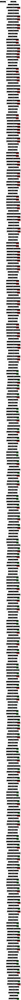

In [ ]:
# Compile the model
model.compile(loss=tfk.losses.BinaryCrossentropy(), optimizer=tfko.AdamW(learning_rate=1e-4, weight_decay=1e-3), metrics=['accuracy'])

# Display a summary of the model architecture
model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [ ]:
history = model.fit(
    train_ds,
    class_weight=class_weights_dict,
    validation_data=validation_dataset,
    epochs=1000,
    callbacks=callbacks
).history


# Calculate and print the final validation accuracy
final_val_accuracy = round(max(history['val_accuracy']) * 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

# Format the filename to avoid special character issues
# Replace decimal point in accuracy with underscore, or convert to an integer
formatted_accuracy = str(final_val_accuracy).replace('.', '_')
model_filename = 'final_model_binary_FT.keras'

# Save model to the Homework directory
model.save(model_filename)
print(f"Model saved as {model_filename} in /content/drive/MyDrive/APPLIED AI/progetto")

Epoch 1/1000
91/91 ━━━━━━━━━━━━━━━━━━━━ 94s 455ms/step - accuracy: 0.3874 - loss: 0.8588 - val_accuracy: 0.4726 - val_loss: 0.7062
Epoch 2/1000
91/91 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - accuracy: 0.3357 - loss: 0.7677 - val_accuracy: 0.2405 - val_loss: 1.7086
Epoch 3/1000
91/91 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.2825 - loss: 0.7729 - val_accuracy: 0.2405 - val_loss: 0.9640
Epoch 4/1000
91/91 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.2796 - loss: 0.6849 - val_accuracy: 0.2489 - val_loss: 0.9550
Epoch 5/1000
91/91 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.3184 - loss: 0.7201 - val_accuracy: 0.2447 - val_loss: 0.8687
Epoch 6/1000
91/91 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.3458 - loss: 0.6656 - val_accuracy: 0.2489 - val_loss: 0.8055
Epoch 7/1000
91/91 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.3740 - loss: 0.6804 - val_accuracy: 0.4937 - val_loss: 0.6857
Epoch 8/1000
91/91 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.4357 - loss: 0.6548 - val_a

##make inference

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)                        ┃ Output Shape                 ┃       Param # ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ input (InputLayer)                  │ (None, 124, 124, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ efficientnetb2 (Functional)         │ (None, 1408)                 │     7,768,569 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ input_layer_3 (InputLayer)     │ (None, 124, 124, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ rescaling (Rescaling)          │ (None, 124, 124, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ normalization (Normalization)  │ (None, 124, 124, 3)          │             7 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ rescaling_1 (Rescaling)        │ (None, 124, 124, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ stem_conv_pad (ZeroPadding2D)  │ (None, 125, 125, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ stem_conv (Conv2D)             │ (None, 62, 62, 32)           │           864 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ stem_bn (BatchNormalization)   │ (None, 62, 62, 32)           │           128 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ stem_activation (Activation)   │ (None, 62, 62, 32)           │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ block1a_dwconv                 │ (None, 62, 62, 32)           │           288 │    N    │
│ (DepthwiseConv2D)                   │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ block1a_bn                     │ (None, 62, 62, 32)           │           128 │    N    │
│ (BatchNormalization)                │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ block1a_activation             │ (None, 62, 62, 32)           │             0 │    -    │
│ (Activation)                        │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ block1a_se_squeeze             │ (None, 32)                   │             0 │    -    │
│ (GlobalAveragePooling2D)            │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ block1a_se_reshape (Reshape)   │ (None, 1, 1, 32)             │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ block1a_se_reduce (Conv2D)     │ (None, 1, 1, 8)              │           264 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ block1a_se_expand (Conv2D)     │ (None, 1, 1, 32)             │           288 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│    └ block1a_se_excit

 Total params: 8,039,294 (30.67 MB)

 Trainable params: 90,241 (352.50 KB)

 Non-trainable params: 7,768,569 (29.63 MB)

 Optimizer params: 180,484 (705.02 KB)

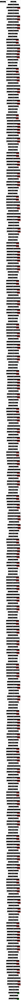

In [49]:
# Load the saved model
model = tfk.models.load_model('tumor_classes_prova1.keras')
#model = tfk.models.load_model('tumor_classes_prova1.keras')
# Display a summary of the model architecture
model.summary(expand_nested=True, show_trainable=True)

# Plot the model architecture
tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [50]:
# Predict labels for the entire test set
#predictions = model.predict(X_test*255, verbose=0)
predictions=(model.predict(X_test*255) > 0.5).astype("int32")
# Display the shape of the predictions
print("Predictions Shape:", predictions.shape)

8/8 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step
Predictions Shape: (237, 1)


In [51]:
labels = ['Benign','Malignant']

Accuracy score over the test set: 0.7257
Precision score over the test set: 0.683
Recall score over the test set: 0.7257
F1 score over the test set: 0.6961


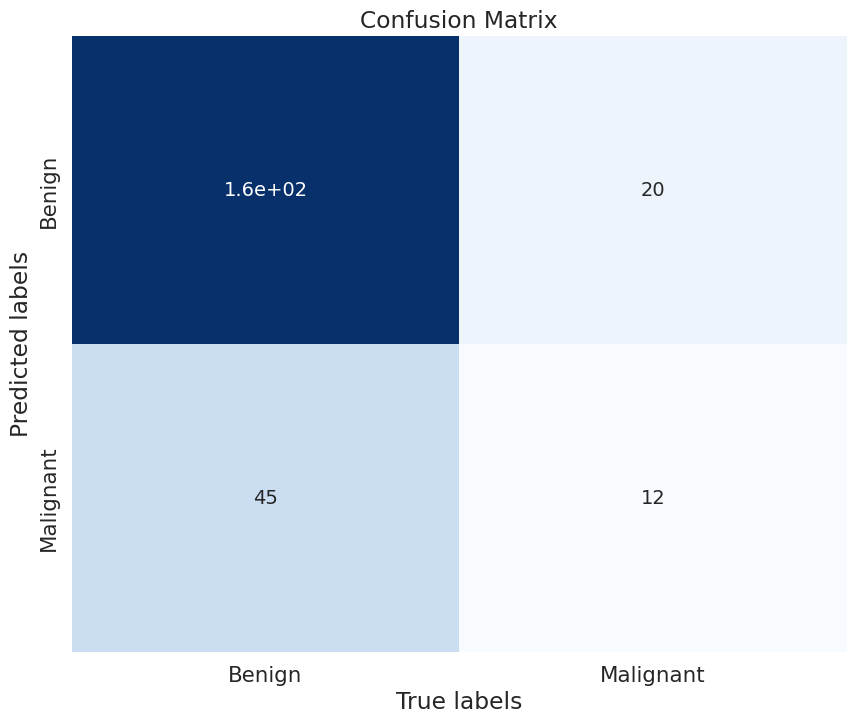

In [52]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Convert predictions and ground truth to class labels
pred_classes = predictions
true_classes = z_test

# Calculate and display metrics
accuracy = accuracy_score(true_classes, pred_classes)
precision = precision_score(true_classes, pred_classes, average='weighted')
recall = recall_score(true_classes, pred_classes, average='weighted')
f1 = f1_score(true_classes, pred_classes, average='weighted')

print(f'Accuracy score over the test set: {round(accuracy, 4)}')
print(f'Precision score over the test set: {round(precision, 4)}')
print(f'Recall score over the test set: {round(recall, 4)}')
print(f'F1 score over the test set: {round(f1, 4)}')

# Compute the confusion matrix
cm = confusion_matrix(true_classes, pred_classes)

# Define class labels (e.g., ['Class 0', 'Class 1', ...])
class_labels = labels  # Replace `labels` with your list of actual class names

# Plot the confusion matrix with class labels
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, xticklabels=class_labels, yticklabels=class_labels, cmap='Blues', cbar=False)
plt.xlabel('True labels')
plt.ylabel('Predicted labels')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
z_test.shape

(237,)

CONFIDENZA

In [ ]:
import numpy as np
import tensorflow as tf

def compute_confidence_metrics_binary(model, X_test, y_test):
    """
    Computes confidence estimation based on predicted and true labels for a binary classification model.

    Args:
        model (tf.keras.Model): Trained Keras model.
        X_test (np.array): NumPy array of test images (N, H, W, C).
        y_test (np.array): True binary labels (N,).

    Returns:
        pred_confidence (dict): Average confidence per predicted class.
        true_confidence (dict): Average confidence per true class.
    """
    # Get sigmoid probabilities from model
    sigmoid_probs = model.predict(X_test, verbose=0).flatten()  # Shape: (N,)

    # Convert probabilities to binary predictions (threshold at 0.5)
    predicted_labels = (sigmoid_probs >= 0.5).astype(int)  # Binary predictions

    # Store confidence values for each class (0 and 1)
    pred_confidence = {}
    true_confidence = {}

    for c in [0, 1]:
        # Confidence per predicted class
        pred_indices = np.where(predicted_labels == c)[0]  # Indices where model predicted class c
        if len(pred_indices) > 0:
            pred_confidence[c] = np.mean(sigmoid_probs[pred_indices])  # Avg confidence for predicted class

        # Confidence per true class
        true_indices = np.where(y_test == c)[0]  # Indices where true label is class c
        if len(true_indices) > 0:
            true_confidence[c] = np.mean(sigmoid_probs[true_indices])  # Avg confidence for true class

    return pred_confidence, true_confidence

# Example Usage:
# Assuming 'X_test' is your NumPy array of test images and 'y_test' contains the true binary labels (not one-hot encoded)
pred_conf, true_conf = compute_confidence_metrics_binary(model, X_test * 255, z_test)

# Print results
print("Confidence based on Predicted Labels:", pred_conf)
print("Confidence based on True Labels:", true_conf)


Confidence based on Predicted Labels: {0: 0.031622764, 1: 0.7339021}
Confidence based on True Labels: {0: 0.068639345, 1: 0.03793519}


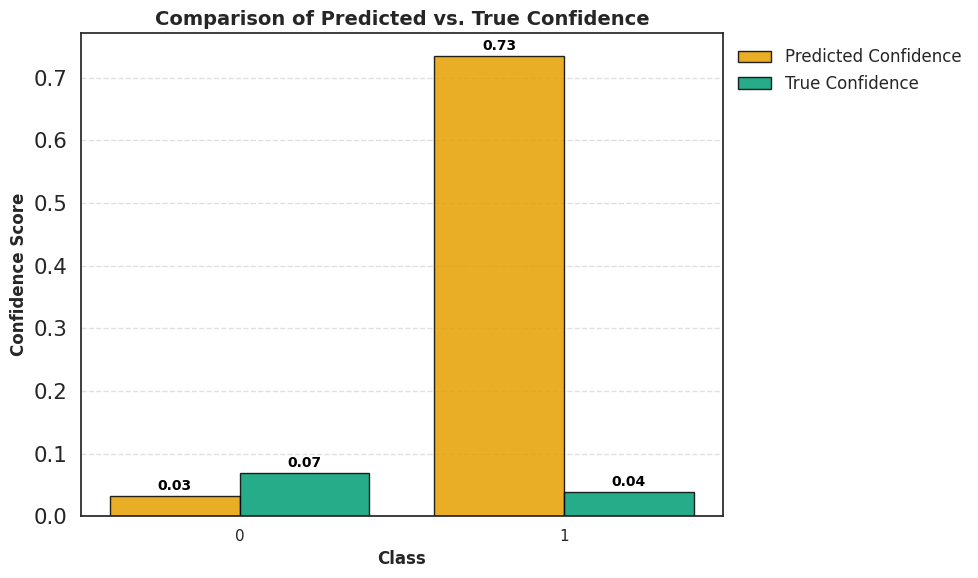

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Convert dictionaries to lists for plotting
classes = list(pred_conf.keys())  # Assuming same keys for both
predicted_conf = [pred_conf[c] for c in classes]
true_conf = [true_conf[c] for c in classes]

# Define width for bars
bar_width = 0.4
x_indexes = np.arange(len(classes))

# Create figure
plt.figure(figsize=(10, 6))

# Define custom colors
predicted_color = "#E69F00"  # Orange
true_color = "#009E73"  # Green

# Plot bars with rounded edges
bars1 = plt.bar(x_indexes - bar_width/2, predicted_conf, width=bar_width, color=predicted_color, edgecolor='black', label="Predicted Confidence", alpha=0.85)
bars2 = plt.bar(x_indexes + bar_width/2, true_conf, width=bar_width, color=true_color, edgecolor='black', label="True Confidence", alpha=0.85)

# Add labels above bars
for bar in bars1:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, f"{bar.get_height():.2f}",
             ha='center', fontsize=10, fontweight='bold', color='black')

for bar in bars2:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, f"{bar.get_height():.2f}",
             ha='center', fontsize=10, fontweight='bold', color='black')

# Labels and title
plt.xlabel("Class", fontsize=12, fontweight='bold')
plt.ylabel("Confidence Score", fontsize=12, fontweight='bold')
plt.title("Comparison of Predicted vs. True Confidence", fontsize=14, fontweight='bold')

# X-axis labels
plt.xticks(x_indexes, classes, fontsize=11)

# Add grid for readability
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Move legend outside the plot
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize=12, frameon=False)

# Improve layout to fit legend outside
plt.tight_layout()

# Show plot
plt.show()

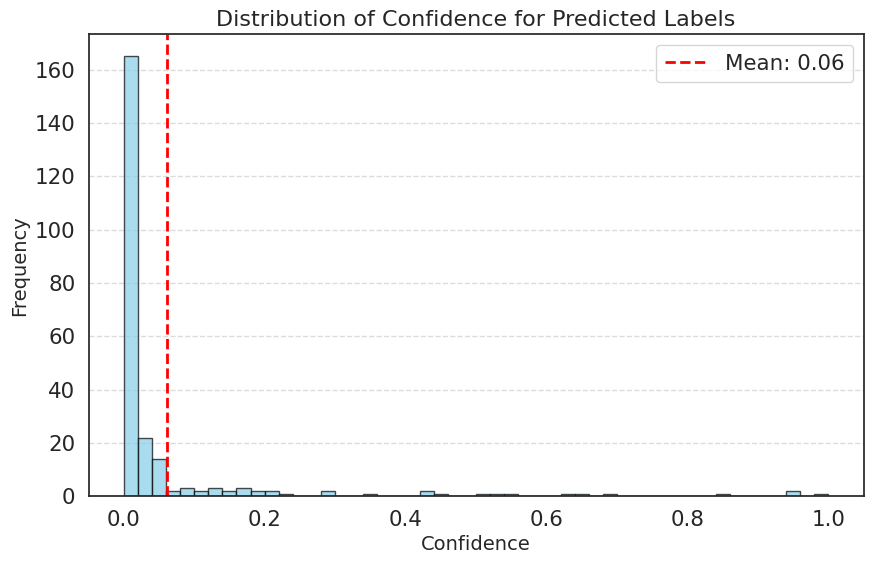

Mean confidence value: 0.061254807


In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

def compute_confidence_distribution(model, X_test, y_test):
    """
    Computes the distribution of confidence for predicted labels.

    Args:
        model (tf.keras.Model): Trained Keras model.
        X_test (np.array): NumPy array of test images (N, H, W, C).
        y_test (np.array): One-hot encoded true labels (N, num_classes).

    Returns:
        pred_confidence_dist (list): Confidence values for each prediction.
    """
    # Get softmax probabilities from the model
    softmax_probs = model.predict(X_test, verbose=0)  # Shape: (N, num_classes)
    predicted_labels = np.argmax(softmax_probs, axis=1)  # Model predictions

    # Confidence values for predicted labels (maximum softmax probability for each prediction)
    pred_confidence_dist = [softmax_probs[i, predicted_labels[i]] for i in range(len(predicted_labels))]

    return pred_confidence_dist

# Example Usage
# Assuming 'X_test' is your test data and 'y_test' contains the true labels (one-hot encoded)
pred_confidence_dist = compute_confidence_distribution(model, X_test*255, z_test)
# Compute mean confidence value
mean_confidence = np.mean(pred_confidence_dist)

# Create histogram
plt.figure(figsize=(10, 6))
plt.hist(pred_confidence_dist, bins=50, color='skyblue', edgecolor='black', alpha=0.7)
plt.axvline(mean_confidence, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_confidence:.2f}')

# Labels and title
plt.xlabel("Confidence", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.title("Distribution of Confidence for Predicted Labels", fontsize=16)

# Grid and legend
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()

# Show plot
plt.show()

# Print mean confidence value
print('Mean confidence value:', mean_confidence)

In [ ]:
model1= model
model2 = tfk.models.load_model('FullSlice_Binary_PreprocessPasq_COnvNextL74.26.keras')

In [ ]:
import numpy as np

def ensemble_predict(model1, model2, X_test, threshold=0.5):
    """
    Perform ensemble prediction where:
    - model2 takes priority when predicting class 1.
    - model1 takes priority when predicting class 0.

    Parameters:
        model1 (tf.keras.Model): First binary classifier.
        model2 (tf.keras.Model): Second binary classifier.
        X_test (numpy.ndarray): Input test data.
        threshold (float): Decision threshold for classification.

    Returns:
        numpy.ndarray: Final ensemble predictions (0 or 1).
    """

    # Get model predictions (probabilities)
    pred1 = (model1.predict(X_test*255) > 0.5).astype("int32")
    pred2 = (model2.predict(X_test*255) > 0.5).astype("int32")

    # Apply ensemble rule
    final_pred = np.where(pred2 == 1, 1, pred1)  # model2 takes priority for class 1

    return final_pred

ensemble_predictions = ensemble_predict(model1, model2, X_test)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 9s 562ms/step


Accuracy score over the test set: 0.7089
Precision score over the test set: 0.6378
Recall score over the test set: 0.7089
F1 score over the test set: 0.6618


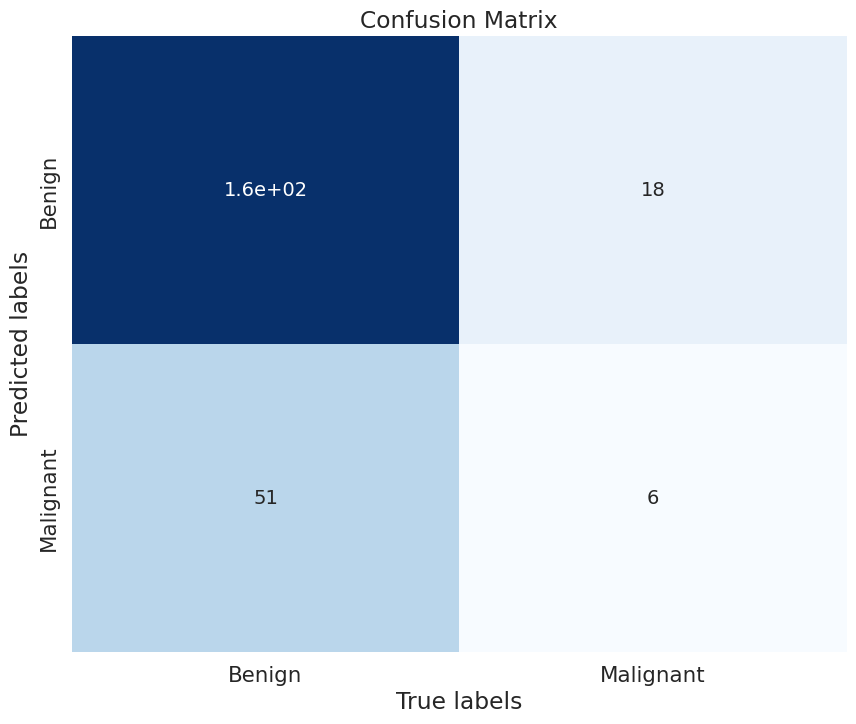

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Convert predictions and ground truth to class labels
pred_classes = ensemble_predictions
true_classes = z_test

# Calculate and display metrics
accuracy = accuracy_score(true_classes, pred_classes)
precision = precision_score(true_classes, pred_classes, average='weighted')
recall = recall_score(true_classes, pred_classes, average='weighted')
f1 = f1_score(true_classes, pred_classes, average='weighted')

print(f'Accuracy score over the test set: {round(accuracy, 4)}')
print(f'Precision score over the test set: {round(precision, 4)}')
print(f'Recall score over the test set: {round(recall, 4)}')
print(f'F1 score over the test set: {round(f1, 4)}')

# Compute the confusion matrix
cm = confusion_matrix(true_classes, pred_classes)

# Define class labels (e.g., ['Class 0', 'Class 1', ...])
class_labels = labels  # Replace `labels` with your list of actual class names

# Plot the confusion matrix with class labels
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, xticklabels=class_labels, yticklabels=class_labels, cmap='Blues', cbar=False)
plt.xlabel('True labels')
plt.ylabel('Predicted labels')
plt.title('Confusion Matrix')
plt.show()
